In [51]:
import numpy as np
import glob
import matplotlib as mpl
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2

#to watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from multiprocessing import Pool
#import dill as pickle
from functools import partial

## Calibrate Camera
Here I have calibrated the camera using the functions as discussed in the tutorials. There are 9 corners in rows and 6 corners in columns. The images in camera_cal folder have been used to calibrate this camera.

In [10]:
#Calculate  object points and image points
def getImagePoints(path='camera_cal/calibration*.jpg'):

    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    chessboards = [] # array of chessboard images

    images = glob.glob(path)

    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (9,6), corners, ret)
            #plt.figure()
            #plt.imshow(img)

    return objpoints, imgpoints

#Calibrates the camera
def calibrate_undistort(img,objpoints,imgpoints):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

The object points and image points calculate here will be used throughout the project to calibrate the camera

In [11]:
objpoints,imgpoints = getImagePoints()

Text(0.5, 1.0, 'Undistorted Image')

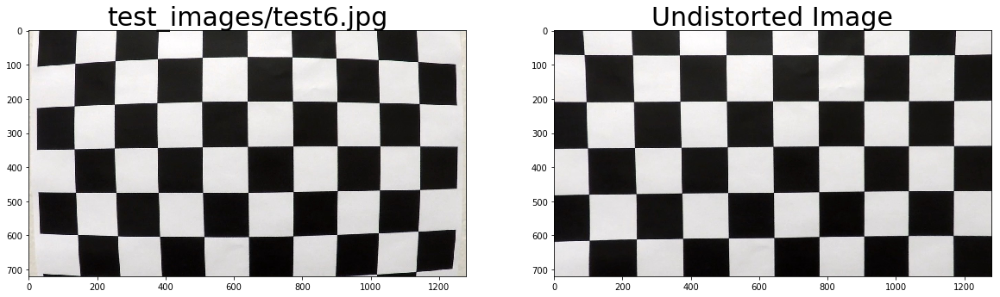

In [76]:
test_img = cv2.imread('camera_cal/calibration1.jpg')
test_img = cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB)
undistort_img = calibrate_undistort(test_img,objpoints,imgpoints)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_img)
cv2.imwrite('output_images/calibration.jpg',undistort_img)
ax1.set_title(fname, fontsize=30)
ax2.imshow(undistort_img)
ax2.set_title('Undistorted Image', fontsize=30)

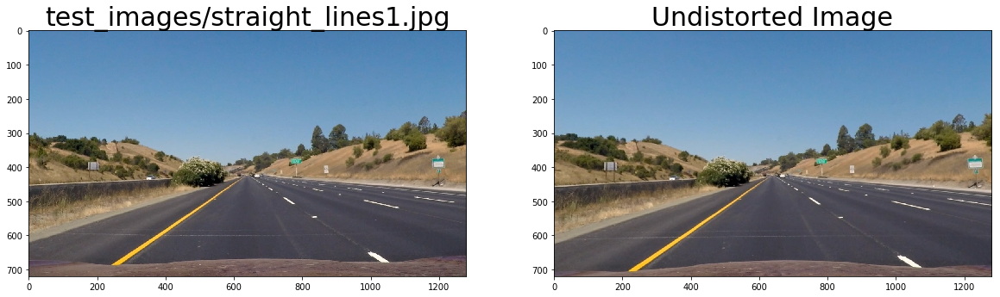

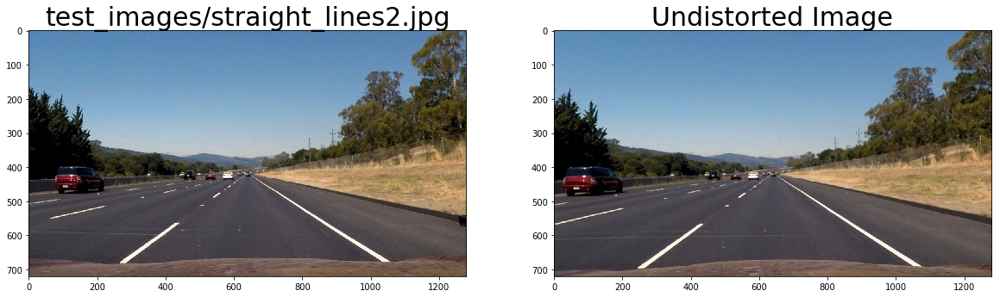

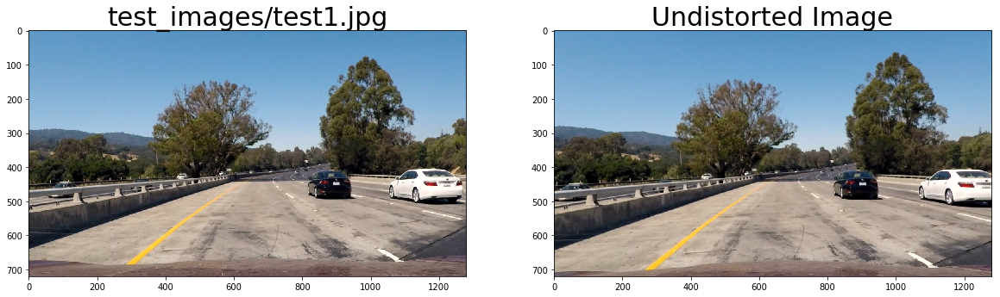

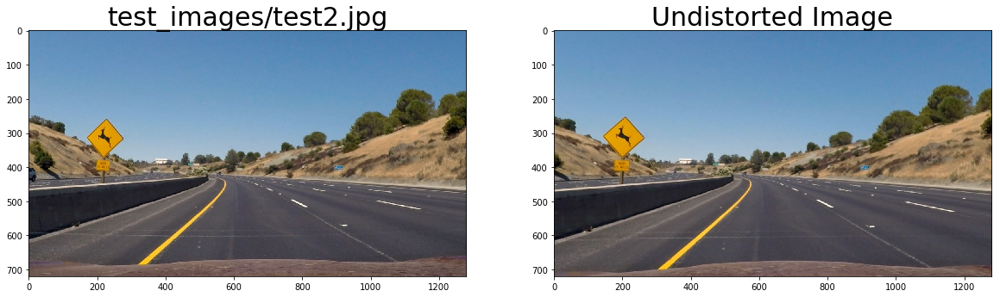

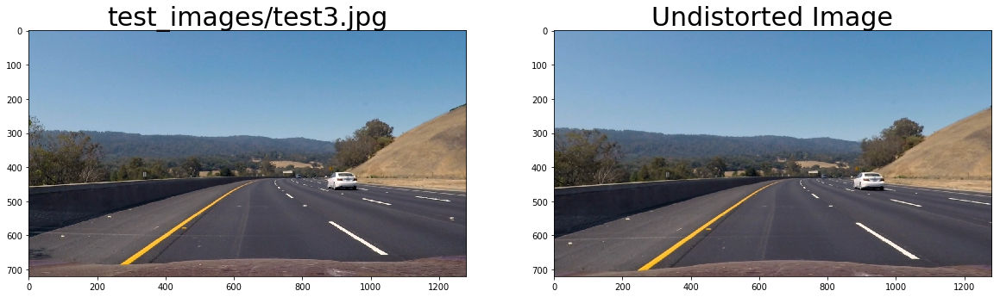

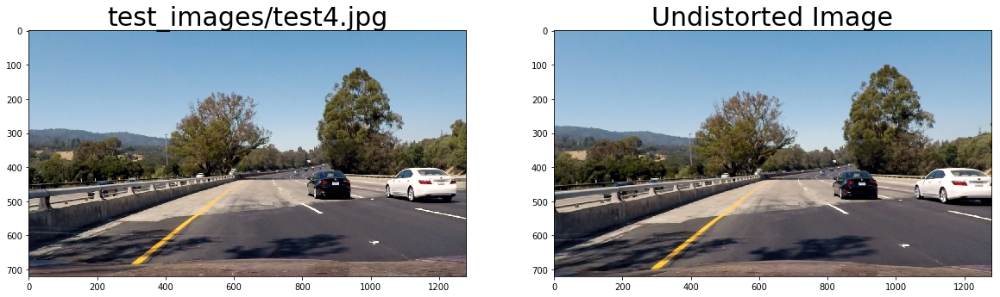

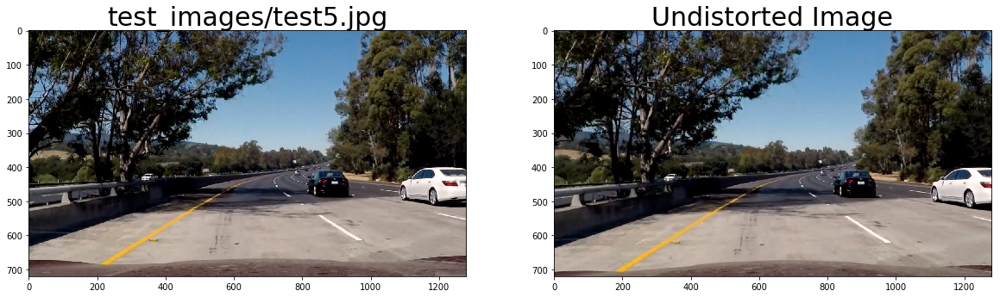

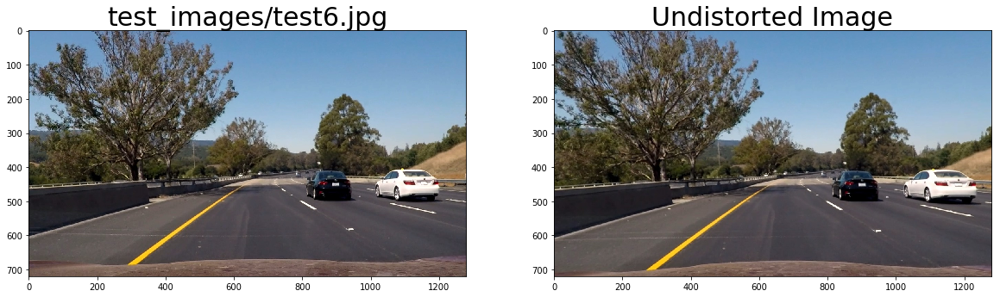

In [77]:
### Test for correct camera calibration ###
images = glob.glob('test_images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    undistort_img = calibrate_undistort(img,objpoints,imgpoints)
    path = 'output_images/undistort/'+fname[12:]
    cv2.imwrite(path,cv2.cvtColor(undistort_img, cv2.COLOR_RGB2BGR))
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title(fname, fontsize=30)
    ax2.imshow(undistort_img)
    ax2.set_title('Undistorted Image', fontsize=30)

# Conversion to Binary
Here three thresholds have been taken after various iterations of trial and error.

1. Direction gradient along x-axis
2. Saturation threshold
3. Red-channel threshold

In [14]:
###Function returns the binary image of the RGB image after applying appropriate thresholds###
def combine_threshold(img,grad_thresh=(20,100),sat_thresh=(170,255),red_thresh=(150,255)):

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= grad_thresh[0]) & (scaled_sobel <= grad_thresh[1])] = 1

    # Threshold saturation channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sat_thresh[0]) & (s_channel <= sat_thresh[1])] = 1

    # Threshold Red Channel
    r=img[:,:,0]
    r_binary = np.zeros_like(r)
    r_binary[(r >= red_thresh[0]) & (r <= red_thresh[1])]=1

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1) | (r_binary==1)] = 1
    
    return combined_binary

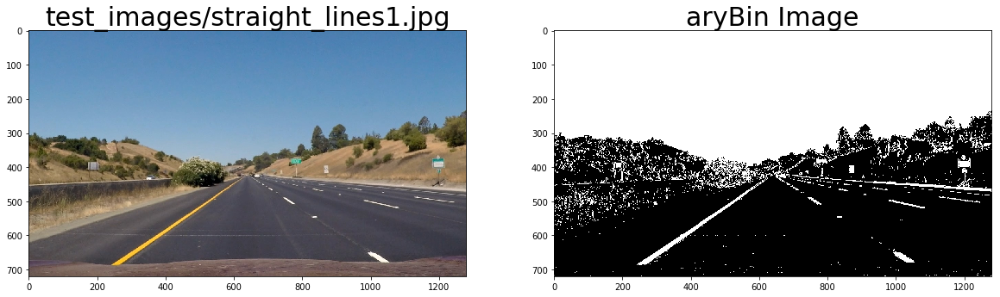

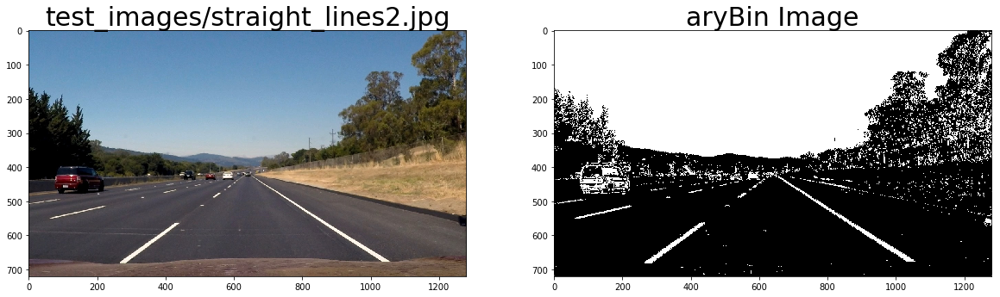

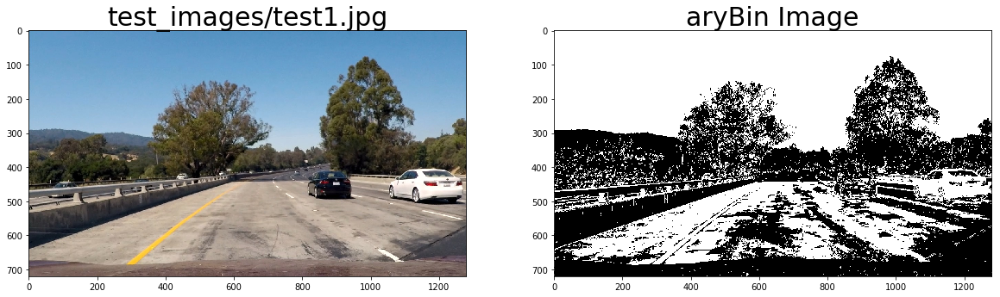

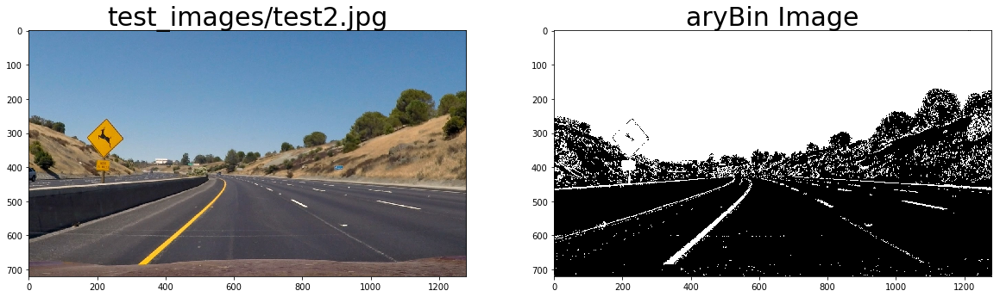

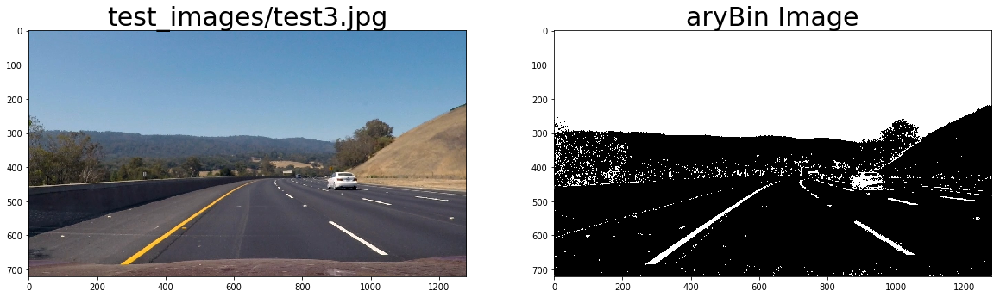

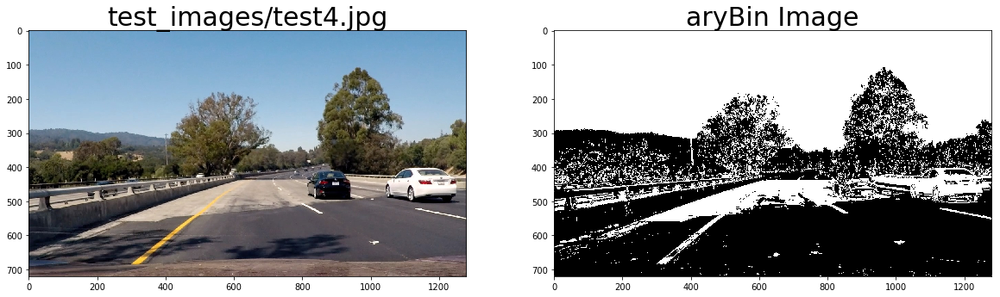

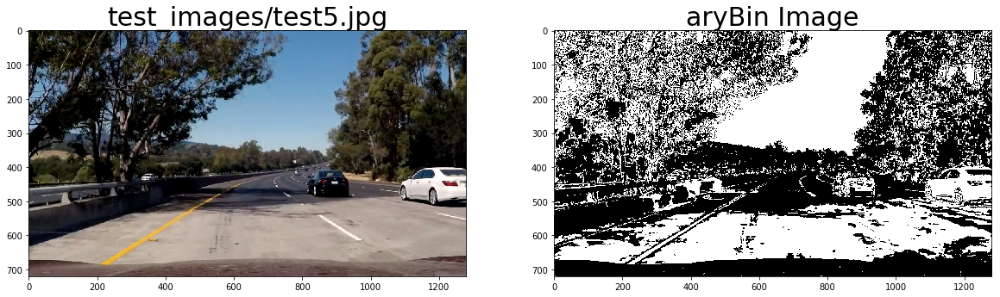

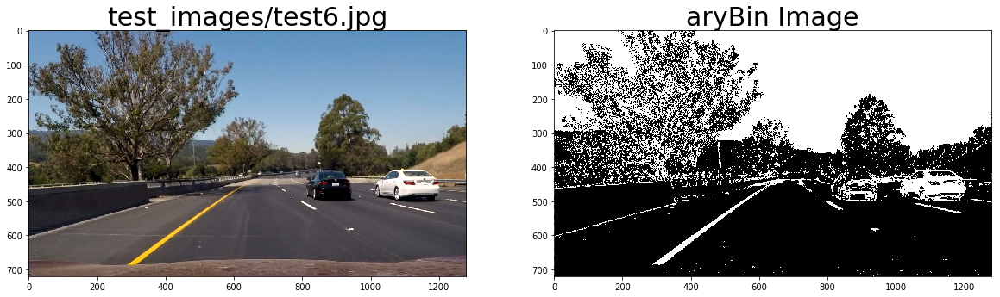

In [79]:
images = glob.glob('test_images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    binary_img = combine_threshold(img)

    # Visualize binary conversion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img,cv2.COLOR_RGB2BGR))
    ax1.set_title(fname, fontsize=30)
    ax2.imshow(binary_img,'gray')
    ax2.set_title('aryBin Image', fontsize=30)

# Perspective Transform
The souce and destination points have been fed manually into the system. The warped image provides a bird's eye view of the area cropped by the polygon. This warped image will be further used to predict lane lines.

In [16]:
#Returns source and destination points for perspective transform
#The points have been chosen manually
def getPoints():
    #Source points
    bottom_left = [220,720]
    bottom_right = [1110, 720]
    top_left = [570, 470]
    top_right = [722, 470]

    src = np.float32([bottom_left,bottom_right,top_right,top_left])

    pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
    pts = pts.reshape((-1,1,2))

    #Destination points
    bottom_left = [320,720]
    bottom_right = [920, 720]
    top_left = [320, 1]
    top_right = [920, 1]

    dst = np.float32([bottom_left,bottom_right,top_right,top_left])
    
    return pts,src,dst



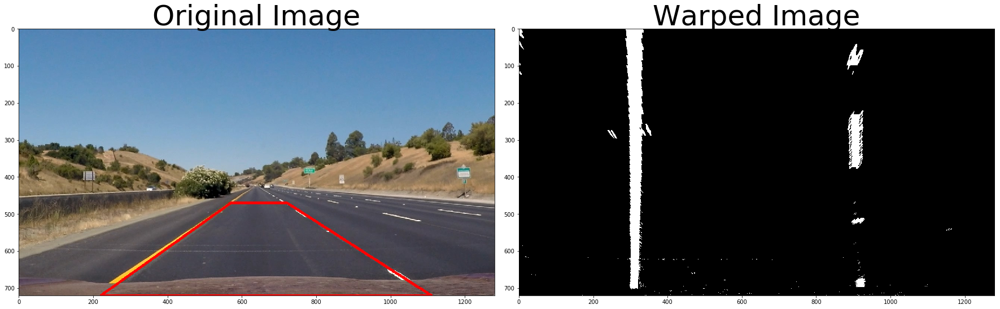

In [86]:
img = cv2.imread('test_images/straight_lines1.jpg')

pts,src,dst = getPoints()
M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
warped = cv2.warpPerspective(combine_threshold(img), M, (img.shape[1], img.shape[0]) , flags=cv2.INTER_LINEAR)

#draw the polygon on source image
copy = img.copy()
cv2.polylines(copy,[pts],True,(0,0,255), thickness=5)

#Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(copy,cv2.COLOR_RGB2BGR))
cv2.imwrite('output_images/polygon.jpg',copy)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Histogram and base index
The following functions are used to create a histogram and find out the peaks and thus the base indices for the left and right lanes

In [20]:
#get histogram
def hist(img):
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)    
    return histogram

#get lane peaks
def lane_peaks(histogram):
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    return leftx_base,rightx_base

base index:
(302, 911)


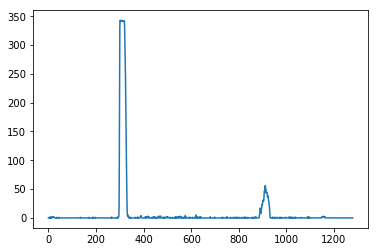

In [29]:
histogram = hist(warped)
plt.plot(histogram)
print("base index:")
print(lane_peaks(histogram))

# Finding Lanes 
The sliding window technique has been used to detect and find lane lines. This is an initial brute force technique to find lane lines. Later in the pipeline, this step has been avoided(wherever possible) and an average of previous 10 frames has been taken to reduce computation and improve accuracy.

In [44]:
### Lane Finding functions | To be used in the pipeline later ###

def get_line_predictions(non_zeros_x, non_zeros_y, left_lane_inds, right_lane_inds, num_rows):
    
    left_x = non_zeros_x[left_lane_inds]
    left_y = non_zeros_y[left_lane_inds]
    
    # If no pixels were found return None
    if(left_y.size == 0 or left_x.size == 0):
        return None, None

    # Fit the polynomial
    polyfit_left = np.polyfit(left_y, left_x, 2)

    right_x = non_zeros_x[right_lane_inds]
    right_y = non_zeros_y[right_lane_inds]
    
    # If no pixels were found return None
    if(right_y.size == 0 or right_x.size == 0):
        return None, None

    # Fit the polynomial
    polyfit_right = np.polyfit(right_y, right_x, 2)

    # If no pixels were found return None
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    # Generate the lane lines from the polynomial fit
    left_x_predictions = polyfit_left[0]*y_points**2 + polyfit_left[1]*y_points + polyfit_left[2]
    right_x_predictions = polyfit_right[0]*y_points**2 + polyfit_right[1]*y_points + polyfit_right[2]
    
    return left_x_predictions, right_x_predictions

def find_lane_pixels(warped):
    #base points
    leftx_base,rightx_base = lane_peaks(hist(warped))
    #output image to draw and visualize result
    out_img = np.dstack((warped, warped, warped))*255
    
    #non-zero pixels
    non_zeros = warped.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    #define parameters
    nwindows = 10
    num_rows = warped.shape[0]
    height = np.int(num_rows/nwindows)
    margin = 50
    minpix = 100

    left_lane_inds = []
    right_lane_inds = []

    for window in range(nwindows):
        y_max = num_rows - window*height
        y_min = num_rows - (window+1)* height

        ###calculate for left lane###

        left_x_min = leftx_base - margin
        left_x_max = leftx_base + margin

        cv2.rectangle(out_img, (left_x_min, y_min), (left_x_max, y_max), [0,0,255],2)

        good_left_inds = ((non_zeros_x >= left_x_min) & (non_zeros_x <= left_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
        left_lane_inds.append(good_left_inds)

        if len(good_left_inds) > minpix:
            leftx_base = np.int(np.mean(non_zeros_x[good_left_inds]))

        ###calculate for right lane###

        right_x_min = rightx_base - margin
        right_x_max = rightx_base + margin

        cv2.rectangle(out_img, (right_x_min, y_min), (right_x_max, y_max), [0,0,255],2)

        good_right_inds = ((non_zeros_x >= right_x_min) & (non_zeros_x <= right_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
        right_lane_inds.append(good_right_inds)

        if len(good_right_inds) > minpix:
            rightx_base = np.int(np.mean(non_zeros_x[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    out_img[non_zeros_y[left_lane_inds], non_zeros_x[left_lane_inds]] = [255,0,0]
    out_img[non_zeros_y[right_lane_inds], non_zeros_x[right_lane_inds]] = [0,0,255]
    
    return get_line_predictions(non_zeros_x, non_zeros_y, left_lane_inds, right_lane_inds, num_rows)
    

(720, 0)

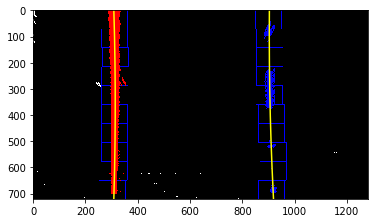

In [81]:
###For testing purposes###

leftx_base,rightx_base = lane_peaks(hist(warped))
#output image to draw and visualize result
out_img = np.dstack((warped, warped, warped))*255

#non-zero pixels
non_zeros = warped.nonzero()
non_zeros_y = non_zeros[0]
non_zeros_x = non_zeros[1]

#define parameters
nwindows = 10
num_rows = warped.shape[0]
height = np.int(num_rows/nwindows)
margin = 50
minpix = 100

left_lane_inds = []
right_lane_inds = []

for window in range(nwindows):
    y_max = num_rows - window*height
    y_min = num_rows - (window+1)* height

    ###calculate for left lane###

    left_x_min = leftx_base - margin
    left_x_max = leftx_base + margin

    cv2.rectangle(out_img, (left_x_min, y_min), (left_x_max, y_max), [0,0,255],2)

    good_left_inds = ((non_zeros_x >= left_x_min) & (non_zeros_x <= left_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
    left_lane_inds.append(good_left_inds)

    if len(good_left_inds) > minpix:
        leftx_base = np.int(np.mean(non_zeros_x[good_left_inds]))

    ###calculate for right lane###

    right_x_min = rightx_base - margin
    right_x_max = rightx_base + margin

    cv2.rectangle(out_img, (right_x_min, y_min), (right_x_max, y_max), [0,0,255],2)

    good_right_inds = ((non_zeros_x >= right_x_min) & (non_zeros_x <= right_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
    right_lane_inds.append(good_right_inds)

    if len(good_right_inds) > minpix:
        rightx_base = np.int(np.mean(non_zeros_x[good_right_inds]))

left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

out_img[non_zeros_y[left_lane_inds], non_zeros_x[left_lane_inds]] = [255,0,0]
out_img[non_zeros_y[right_lane_inds], non_zeros_x[right_lane_inds]] = [0,0,255]

left_x = non_zeros_x[left_lane_inds]
left_y = non_zeros_y[left_lane_inds]

# Fit the polynomial
polyfit_left = np.polyfit(left_y, left_x, 2)

right_x = non_zeros_x[right_lane_inds]
right_y = non_zeros_y[right_lane_inds]

# Fit the polynomial
polyfit_right = np.polyfit(right_y, right_x, 2)

# If no pixels were found return None
y_points = np.linspace(0, num_rows-1, num_rows)

# Generate the lane lines from the polynomial fit
left_x_predictions = polyfit_left[0]*y_points**2 + polyfit_left[1]*y_points + polyfit_left[2]
right_x_predictions = polyfit_right[0]*y_points**2 + polyfit_right[1]*y_points + polyfit_right[2]

plt.imshow(out_img,'gray')
plt.plot(left_x_predictions, y_points, color='yellow')
plt.plot(right_x_predictions, y_points, color='yellow')
plt.xlim(0, warped.shape[1])
plt.ylim(warped.shape[0],0)

# Finding Radius of Curvature and offset
The ROC and offset of the car from the center of the road has been calculated by using the formula as mentioned in the tutorials.

In [52]:
def rad_curvature(x_values):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # If no pixels were found return None
    y_points = np.linspace(0, num_rows-1, num_rows)
    y_eval = np.max(y_points)

    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(y_points*ym_per_pix, x_values*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    return curverad

def get_radius_offset(left_x_predictions,right_x_predictions):
    #compute radius of curvature
    left_rad = rad_curvature(left_x_predictions)
    right_rad = rad_curvature(right_x_predictions)
    avg_rad = (left_rad + right_rad)/2

    # compute the offset from the center
    lane_center = (right_x_predictions[719] + left_x_predictions[719])/2
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    center_offset_pixels = abs(img_size[0]/2 - lane_center)
    center_offset_mtrs = xm_per_pix*center_offset_pixels
    
    return avg_rad,center_offset_mtrs

In [53]:
num_rows = warped.shape[0]
img_size = img.shape
avg_rad,center_offset_mtrs = get_radius_offset(left_x_predictions,right_x_predictions)
str = "Radius of curvature: %.2f m" % avg_rad
print(str)
str = "Center offset: %.2f m" % center_offset_mtrs
print(str)

Radius of curvature: 3963.58 m
Center offset: 1.34 m


# Final Pipeline 
Finally all the above functions have been pipelined into this function. Past 10 frames have been considered while taking average of the lines.

In [67]:
# Finds average of past 10 lines and returns it
def get_averaged_line(prev_lines, new_line):
    
    #Number of previous frames to be considered for average
    num_frames = 10
    
    if new_line is None:
        if len(prev_lines) == 0:
            return prev_lines, None
        else:
            return prev_lines, prev_lines[-1]
    else:
        if len(prev_lines) < num_frames:
            #append frame
            prev_lines.append(new_line)
            return prev_lines, new_line
        else:
            #take average
            prev_lines[0:num_frames-1] = prev_lines[1:]
            prev_lines[num_frames-1] = new_line
            new_line = np.zeros_like(new_line)
            for i in range(num_frames):
                new_line += prev_lines[i]
            new_line = new_line/num_frames
            return prev_lines, new_line
        
        
def get_mean_distance(left_line, right_line, curr_avg):
    
    mean_dist = np.mean(right_line - left_line)
    if curr_avg == 0:
        curr_avg = mean_dist
    else:
        curr_avg = 0.9*curr_avg + 0.1*mean_dist
    return curr_avg
    

In [68]:
#define global variables
polyfit_left=None
polyfit_right=None

past_good_left_lines = []
past_good_right_lines = []

curr_mean_diff = 0

def pipeline(img):
    # global variables to store the polynomial coefficients of the line detected in the last frame
    global polyfit_right
    global polyfit_left
    
    # global variables to store the line coordinates in previous n (=14) frames
    global past_good_right_lines
    global past_good_left_lines
    
    # global variable which contains running average of the mean difference between left and right lanes
    global curr_mean_diff
    
    #undistort frame
    img = calibrate_undistort(img,objpoints,imgpoints)
    
    # get thresholded image
    thresholded = combine_threshold(img)
    
    # perform a perspective transform
    warped = cv2.warpPerspective(thresholded, M, (image_shape[1], image_shape[0]) , flags=cv2.INTER_LINEAR)
    
    #output image to show the resultant identified lines
    out_img = np.dstack((warped, warped, warped))*255
    
    non_zeros = warped.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    num_rows = warped.shape[0]
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    #flag indicates that you have to find lane lines from scratch(without any prior information)
    
    if (polyfit_left is None) or (polyfit_right is None):
        # If the polynomial coefficients of the previous frames are None then find lane line from scratch
        flag = True
        left_x_predictions, right_x_predictions = find_lane_pixels(warped)
    else:
        # Else search in a margin of 100 pixels on each side of the pervious polynomial fit
        flag = False
        margin = 100
        left_x_predictions = polyfit_left[0]*non_zeros_y**2 + polyfit_left[1]*non_zeros_y + polyfit_left[2]
        left_lane_inds = ((non_zeros_x >= left_x_predictions - margin) & (non_zeros_x <= left_x_predictions + margin)).nonzero()[0]

        right_x_predictions = polyfit_right[0]*non_zeros_y**2 + polyfit_right[1]*non_zeros_y + polyfit_right[2]
        right_lane_inds = ((non_zeros_x >= right_x_predictions - margin) & (non_zeros_x <= right_x_predictions + margin)).nonzero()[0]
        
        left_x_predictions, right_x_predictions = get_line_predictions(non_zeros_x, non_zeros_y, left_lane_inds, right_lane_inds, num_rows)
    
    if (left_x_predictions is None or right_x_predictions is None):
        if not flag:
            left_x_predictions, right_x_predictions = find_lane_pixels(warped)
            
    # Outlier flag to detect and remove outliers
    #I got the idea after reading his blog
    #https://medium.com/@amalhotra/udacity-self-driving-car-engineer-nanodegree-project-4-advanced-lane-finding-44ba55fd9785
    
    outlier = False
            
    if (left_x_predictions is None or right_x_predictions is None):
        outlier = True
    else:
        mean_diff = np.mean(right_x_predictions - left_x_predictions)
        
        if curr_mean_diff == 0:
            curr_mean_diff = mean_diff
        #The threshold values are taken after trial and error
        if (mean_diff < 0.7*curr_mean_diff or mean_diff > 1.3*curr_mean_diff):
            outlier = True
            if not flag:
                left_x_predictions, right_x_predictions = find_lane_pixels(warped)
                if (left_x_predictions is None or right_x_predictions is None):
                    outlier = True
                else:
                    mean_diff = np.mean(right_x_predictions - left_x_predictions)
                    if (mean_diff < 0.7*curr_mean_diff or mean_diff > 1.3*curr_mean_diff):
                        outlier = True
                    else:
                        outlier = False
        else:
            outlier = False
            
    if outlier:
        polyfit_left = None
        polyfit_right = None
        if len(past_good_left_lines) == 0 and len(past_good_right_lines) == 0:
            return img
        else:
            left_x_predictions = past_good_left_lines[-1]
            right_x_predictions = past_good_right_lines[-1]
    else:
        past_good_left_lines, left_x_predictions = get_averaged_line(past_good_left_lines, left_x_predictions)
        past_good_right_lines, right_x_predictions = get_averaged_line(past_good_right_lines, right_x_predictions)
        mean_diff = np.mean(right_x_predictions - left_x_predictions)
        #Take weighted average. Weights are taken according to the number of past frames(10)
        curr_mean_diff = 0.9*curr_mean_diff + 0.1*mean_diff
    
    left_line_window = np.array(np.transpose(np.vstack([left_x_predictions, y_points])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_x_predictions, y_points]))))
    
    #get radius of curvature and offset from center
    avg_rad,center_offset_mtrs = get_radius_offset(left_x_predictions,right_x_predictions)
    
    #Fill green
    poly_points = np.vstack([left_line_window, right_line_window])    
    cv2.fillPoly(out_img, np.int_([poly_points]), [0,255, 0])    
    unwarped = cv2.warpPerspective(out_img, M_inv, (image_shape[1], image_shape[0]) , flags=cv2.INTER_LINEAR)
    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)
    
    #Print data on video
    radius_str = "Radius of curvature: %.2f m" % avg_rad
    offset_str = "Center offset: %.2f m" % center_offset_mtrs
    cv2.putText(result,radius_str , (80, 80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=2)
    cv2.putText(result, offset_str, (80, 110), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=2)
    
    return result

# Testing the pipeline

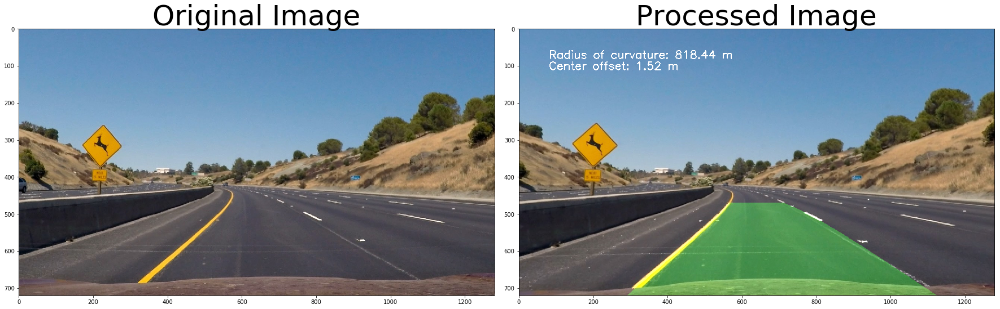

In [83]:
img = mpimg.imread('test_images/test2.jpg')
image_shape = img.shape
# Reinitialize some global variables.
polyfit_left = None
polyfit_right = None
past_good_right_lines = []
past_good_left_lines = []
curr_mean_diff = 0

# Apply pipeline
processed = pipeline(img)
cv2.imwrite('output_images/pipeline_output.jpg',cv2.cvtColor(processed,cv2.COLOR_RGB2BGR))

# Plot the 2 images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(processed, cmap='gray')
ax2.set_title('Processed Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Video Output

In [71]:
# Reinitialize some global variables.
polyfit_left = None
polyfit_right = None
past_good_right_lines = []
past_good_left_lines = []
curr_mean_diff = 0


output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [18:56<00:00,  1.23it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 21min 9s, sys: 34 s, total: 21min 43s
Wall time: 18min 56s
